In [1]:
from reflect.components.flow_world_model.dynamic_model import DynamicFlowModel, DynamicAttentionalFlowModel
from reflect.components.flow_world_model.world_model_actor import WorldModelActor
from reflect.components.flow_world_model.world_model import WorldModel
from reflect.data.loader import EnvDataLoader
from reflect.components.models.actor import Actor

from tqdm import tqdm
from livelossplot import PlotLosses
import gymnasium as gym
from dataclasses import asdict
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import torch.optim as optim

/Users/alexathorne/development/personal/world-model-rl/venv/lib/python3.10/site-packages/gymnasium/envs/registration.py:512: DeprecationWarning: WARN: The environment InvertedPendulum-v4 is out of date. You should consider upgrading to version `v5`.
  logger.deprecation(


In [2]:
env = gym.make('Pendulum-v1')

state_dim = env.observation_space.shape[0]
action_dim = env.action_space.shape[0]

actor = Actor(
    input_dim=state_dim,
    output_dim=action_dim,
    bound=env.action_space.high,
    num_layers=3,
    hidden_dim=256,
)

world_model_actor = WorldModelActor(
    actor=actor,
)

env_data_loader = EnvDataLoader(
    num_time_steps=10,
    state_shape=(state_dim,),
    policy=world_model_actor,
    env=env,
    use_imgs_as_states=False,
)


In [3]:
for _ in tqdm(range(1)):
    env_data_loader.perform_rollout()

100%|██████████| 1/1 [00:00<00:00,  7.09it/s]


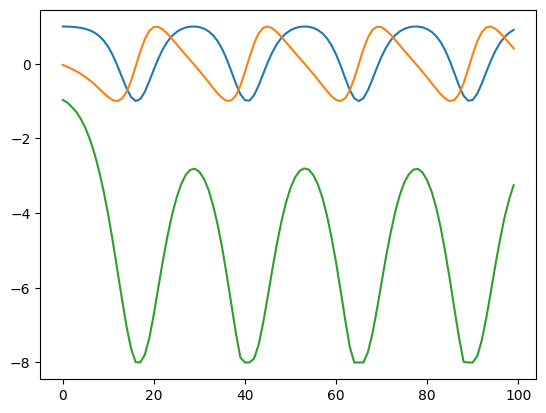

In [4]:
import matplotlib.pyplot as plt
plt.plot(env_data_loader.state_buffer[0][:, 0])
plt.plot(env_data_loader.state_buffer[0][:, 1])
plt.plot(env_data_loader.state_buffer[0][:, 2])
plt.show()

In [5]:
device='cpu'

In [6]:
state_dim = 3+1+1
action_dim = 1

dynamic_model = DynamicFlowModel(
    input_dim=state_dim,
    conditioning_dim=3*(state_dim + action_dim),
    output_dim=state_dim,
    time_embed_dim=16,
    hidden_dim=128,
    depth=2,
    use_layer_norm=True,
    num_positions=3,
)

world_model = WorldModel(
    dynamic_model=dynamic_model,
    observation_dim=state_dim-2,
    action_dim=action_dim,
    environment_action_bound=env.action_space.high,
)

# dynamic_model = DynamicAttentionalFlowModel(
#     input_dim=state_dim,
#     conditioning_dim=state_dim + action_dim,
#     output_dim=state_dim,
#     num_heads=4,
#     hidden_dim=256,
#     depth=2,
#     use_layer_norm=True,
#     num_positions=3,
# )

# world_model = WorldModel(
#     dynamic_model=dynamic_model,
#     observation_dim=state_dim-2,
#     action_dim=action_dim,
#     environment_action_bound=env.action_space.high,
# )


In [7]:
o, *_ = env.reset()
total_reward = 0
images = []
obs = []
actions = []
rewards = []
dones = []

for _ in range(1000):
    a = actor(torch.tensor(o).to(torch.float32).to(device), deterministic=True)
    # a = env.action_space.sample()
    a = a.cpu().detach().numpy()
    o, r, d, t, info = env.step(a)
    obs.append(o)
    actions.append(a)
    rewards.append(r)
    dones.append(d)
    images.append(env.render())
    if d:
        break

o = torch.tensor(obs)[None]
a = torch.tensor(actions)[None]
r = torch.tensor(rewards)[None, :, None].to(torch.float32)
d = torch.tensor(dones)[None, :, None].to(torch.float32)

/Users/alexathorne/development/personal/world-model-rl/venv/lib/python3.10/site-packages/gymnasium/envs/classic_control/pendulum.py:177: UserWarning: WARN: You are calling render method without specifying any render mode. You can specify the render_mode at initialization, e.g. gym.make("Pendulum-v1", render_mode="rgb_array")
  gym.logger.warn(
/var/folders/pb/2v43qld56svb17jrw__wt5mm0000gn/T/ipykernel_73977/3433019148.py:22: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:278.)
  o = torch.tensor(obs)[None]


In [8]:
print(o.shape, a.shape, r.shape, d.shape)

torch.Size([1, 1000, 3]) torch.Size([1, 1000, 1]) torch.Size([1, 1000, 1]) torch.Size([1, 1000, 1])


In [9]:
import matplotlib.pyplot as plt
import random


def plot():
    start_i=0
    length=200
    inds = torch.randint(0, 1000 - 4, (256,))
    inds = inds[:, None] + torch.arange(4)[None, :]
    losses = world_model.update(o[0, inds], a[0, inds], r[0, inds], d[0, inds])
    losses = asdict(losses)

    img_o, img_a, img_r, img_d = world_model.imagine_rollout(
        o[:, start_i:start_i+10],
        a[:, start_i:start_i+10],
        r[:, start_i:start_i+10],
        d[:, start_i:start_i+10],
        actor,
        num_timesteps=length,
        num_flow_steps=10,
        noise_scale=0.001
    )

    start_i=0
    length=100

    img_o = img_o.detach()
    img_r = img_r.detach()
    fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(15, 5))
    axs[0].plot(o[0, start_i:length+start_i, 0].cpu(), color='red', linestyle='-')
    axs[0].plot(o[0, start_i:length+start_i, 1].cpu(), color='black', linestyle='-')
    axs[0].plot(o[0, start_i:length+start_i, 2].cpu(), color='green', linestyle='-')
    axs[1].plot(r[0, start_i:length+start_i, 0].cpu())

    axs[0].plot(img_o[0, :length, 0].cpu(), color='red', linestyle='--',)
    axs[0].plot(img_o[0, :length, 1].cpu(), color='black', linestyle='--',)
    axs[0].plot(img_o[0, :length, 2].cpu(), color='green', linestyle='--',)
    axs[1].plot(img_r[0, :length, 0].cpu(), linestyle='--',)

    plt.show()

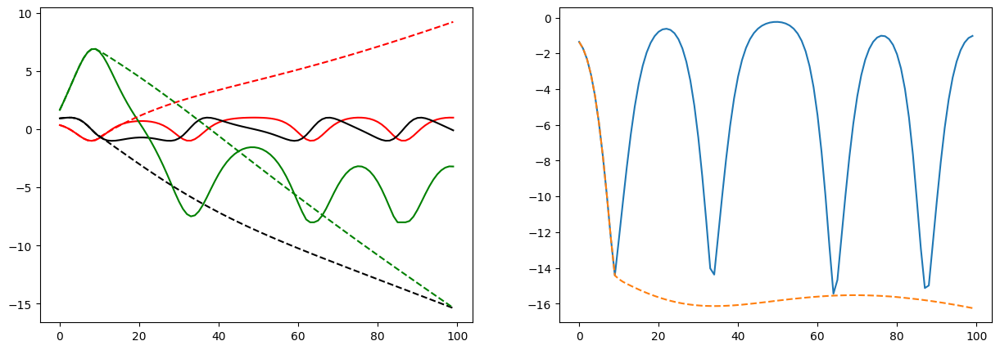

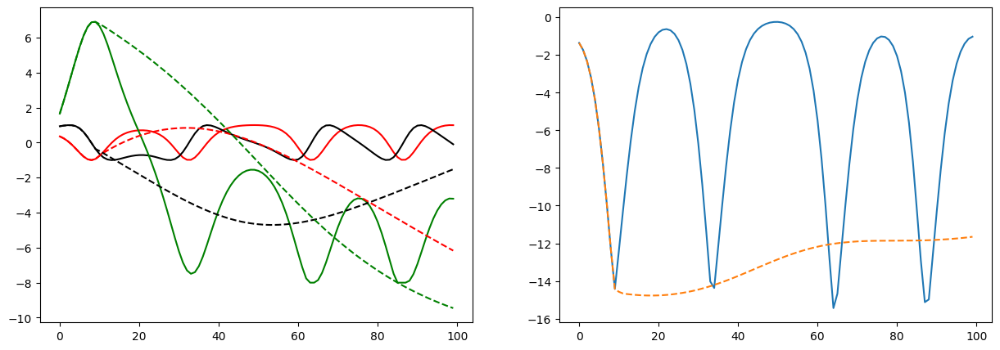

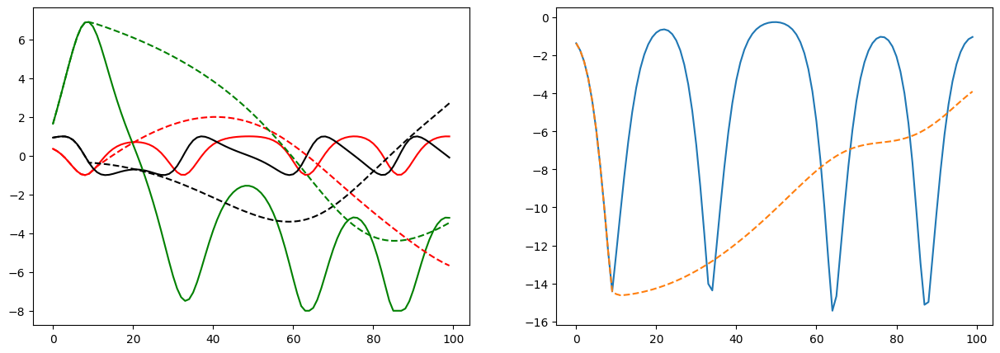

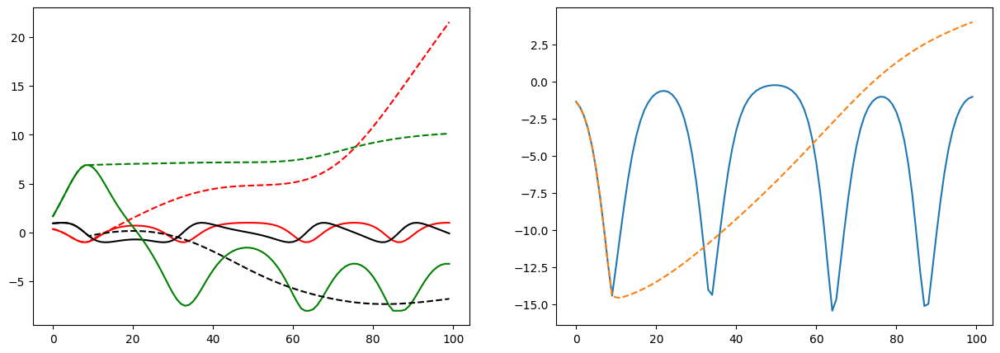

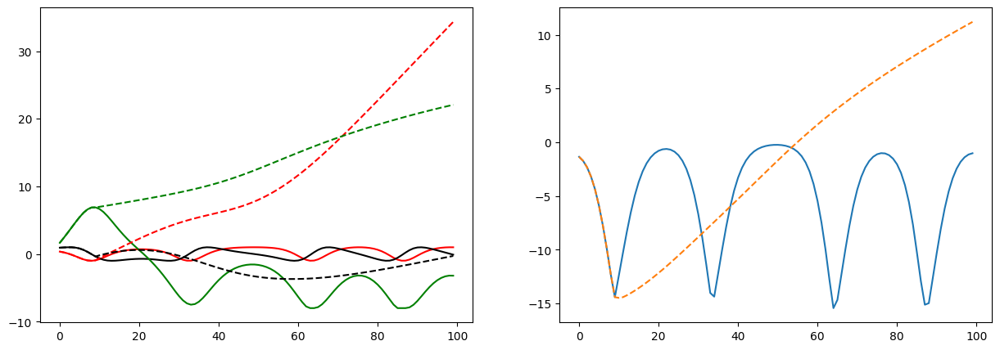

...

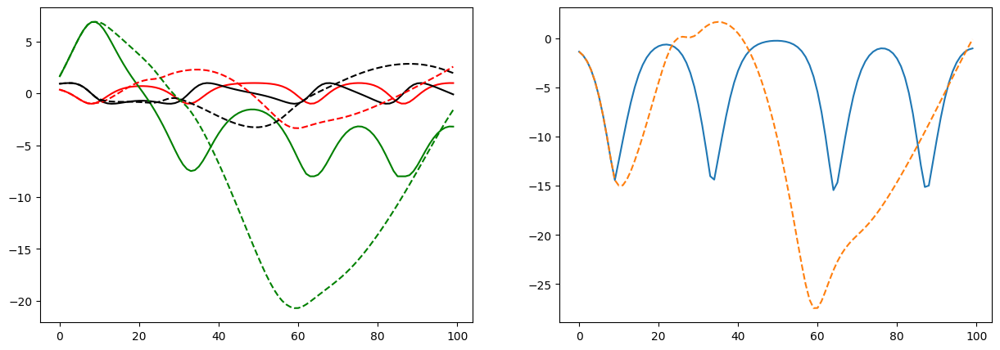

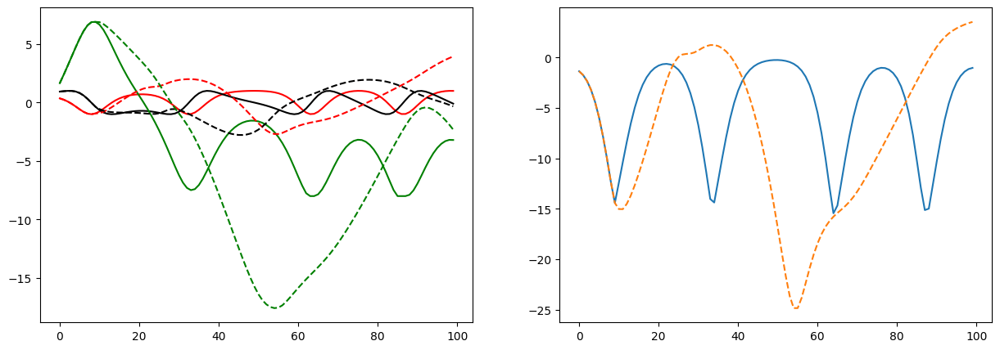

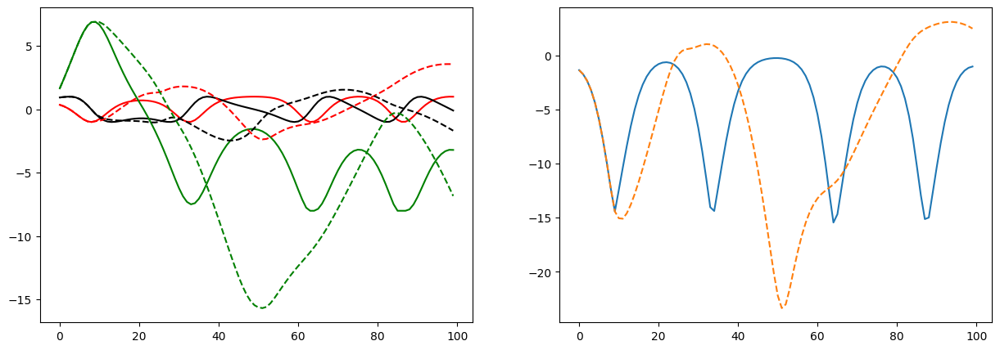

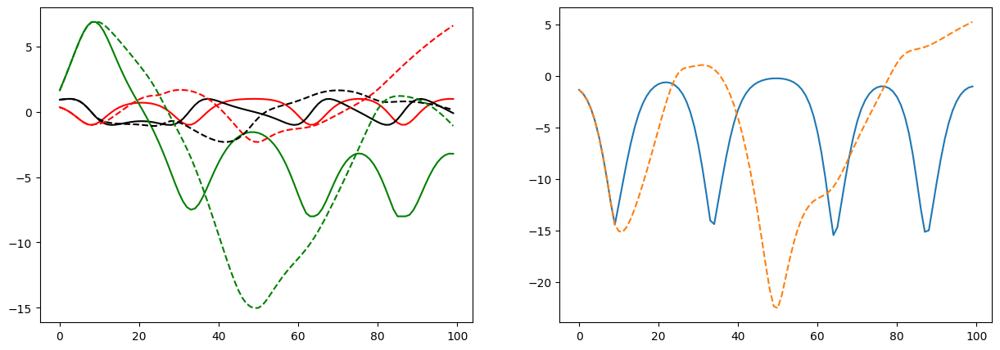

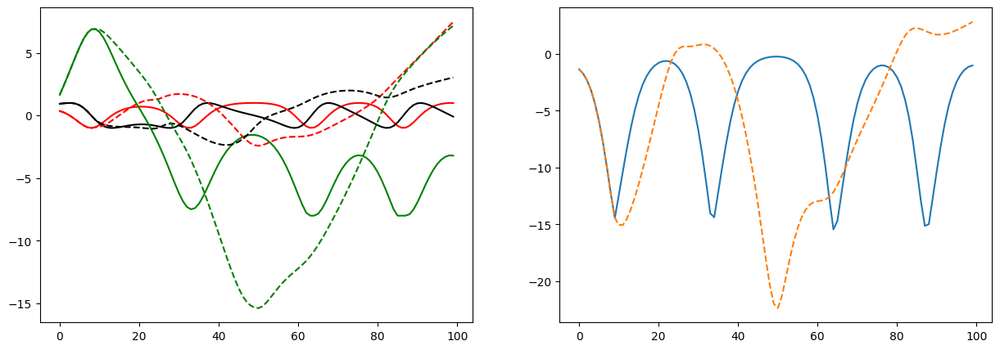

In [10]:
for _ in range(100):
    plot()